<h2>Face Recognition

In [ ]:
#pip install face_recognition

In [1]:
import face_recognition
import os, sys
import cv2
import numpy as np
import math

In [14]:
import glob
import matplotlib.pyplot as plt

In [3]:
knownpath =xyz

In [4]:
knownimages = glob.glob(knownpath)

In [5]:
def getknownnames(knownimages):
    names=[]
    for i in range(len(knownimages)):
        n= knownimages[i].split("/")[-1].split(".")[0]
        names.append(n)
    return names

In [6]:
known_names=getknownnames(knownimages)
known_names

['Raymond', 'Karim', 'Rita', 'Simon', 'Samantha', 'Katie', 'RJ', 'Frank']

In [7]:
knownimages 

['/Users/user/Desktop/2023python/facerecognition/known/Raymond.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Karim.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Rita.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Simon.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Samantha.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Katie.png',
 '/Users/user/Desktop/2023python/facerecognition/known/RJ.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Frank.png']

In [8]:
known_image = face_recognition.load_image_file(knownimages[1])
unknown_image = face_recognition.load_image_file(knownimages[0])

In [9]:
face_recognition.face_encodings(known_image)[0]

array([-7.65387416e-02,  8.06531012e-02,  6.94729239e-02, -2.15685572e-02,
       -1.39013827e-01,  7.78630823e-02, -3.79098877e-02, -1.07155666e-01,
        1.01710476e-01, -1.09645143e-01,  1.34326771e-01, -2.88560390e-02,
       -2.30102628e-01, -3.59606966e-02, -4.94374931e-02,  1.55874461e-01,
       -1.92585468e-01, -1.96192056e-01, -1.32567495e-01, -5.67515269e-02,
       -5.22480011e-02,  4.91596200e-02, -1.29733309e-02, -7.97569007e-03,
       -3.27246338e-02, -3.88005346e-01, -3.68784219e-02, -7.31641501e-02,
        8.59502554e-02, -1.22747436e-01, -2.51354016e-02,  8.30354616e-02,
       -1.27671972e-01, -2.60543972e-02,  9.16711241e-03,  6.63136318e-02,
       -2.98580676e-02, -1.41026914e-01,  1.90749198e-01,  5.99080417e-03,
       -1.48449004e-01, -4.42736447e-02,  6.28445894e-02,  2.86815196e-01,
        1.44123867e-01,  1.96144953e-02,  3.29720452e-02,  8.62997770e-03,
        1.48581743e-01, -2.39092380e-01,  1.15295023e-01,  1.03491545e-01,
        2.05832094e-01,  

In [10]:
raymond_encoding= face_recognition.face_encodings(known_image)[0]

In [11]:
known_image.shape

(120, 104, 3)

In [12]:
raymond_encoding.shape

(128,)

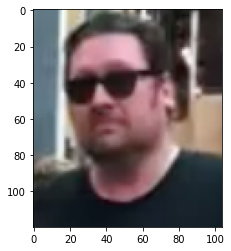

In [15]:
plt.imshow(known_image)

In [16]:
karim_encoding = face_recognition.face_encodings(unknown_image)[0]

In [17]:
face_recognition.compare_faces([raymond_encoding], karim_encoding)

[False]

In [18]:
face_recognition.compare_faces([raymond_encoding], raymond_encoding)

[True]

In [19]:
fram_check="facerecognition/frame.png"

In [20]:
frame_load = face_recognition.load_image_file(fram_check)

In [21]:
frame_rgb= frame_load[:, :, ::-1]

In [22]:
face_recognition.tolerance = 0.90

In [23]:
face_recognition.face_locations(frame_rgb)

[(216, 524, 305, 434), (115, 709, 177, 646), (222, 1126, 274, 1074)]

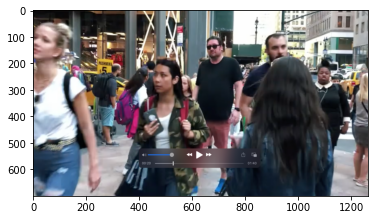

In [24]:
plt.imshow(frame_load)

In [25]:
face_locations =face_recognition.face_locations(frame_rgb)

In [26]:
face_encodings = face_recognition.face_encodings(frame_rgb, face_locations)

In [27]:
len(face_encodings)

3

In [30]:
match = face_recognition.compare_faces(karim_encoding, face_encodings)
print(match)

[False, False, False]


In [31]:
karim_encoding.shape

(128,)

In [34]:
for face_encoding in face_encodings:
    match = face_recognition.compare_faces([raymond_encoding], face_encoding)
    print(match)
     

[False]
[True]
[False]


In [35]:
frame_rgb.shape

(700, 1264, 3)

In [36]:
for (top, right, bottom, left), name in zip(face_locations, known_names[:3]):
    print((top, right, bottom, left), name)

(216, 524, 305, 434) Raymond
(115, 709, 177, 646) Karim
(222, 1126, 274, 1074) Rita


In [37]:
for (top, right, bottom, left), name in zip(face_locations, known_names[:3]):
        if not name:
            continue

        # Draw a box around the face
        cv2.rectangle(frame_load, (left, top), (right, bottom), (0, 0, 255), 2)

        # Draw a label with a name below the face
        cv2.rectangle(frame_load, (left, bottom - 25), (right, bottom), (0, 0, 255), cv2.FILLED)
        font = cv2.FONT_HERSHEY_DUPLEX
        cv2.putText(frame_load, name, (left + 6, bottom - 6), font, 0.5, (255, 255, 255), 1)
        

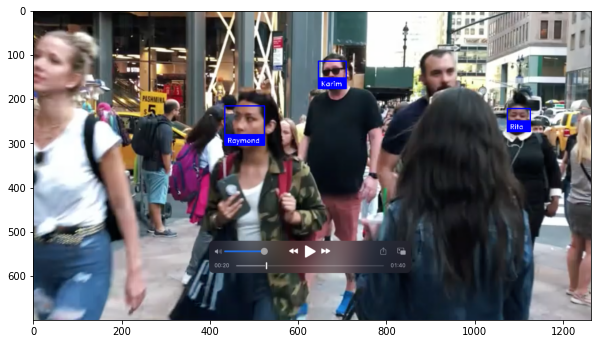

In [38]:
plt.figure(figsize=(10,7))
plt.imshow(frame_load)

<h2> NY video

In [39]:
knownimages 

['/Users/user/Desktop/2023python/facerecognition/known/Raymond.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Karim.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Rita.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Simon.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Samantha.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Katie.png',
 '/Users/user/Desktop/2023python/facerecognition/known/RJ.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Frank.png']

In [40]:
known_names

['Raymond', 'Karim', 'Rita', 'Simon', 'Samantha', 'Katie', 'RJ', 'Frank']

In [42]:
knownimages

['/Users/user/Desktop/2023python/facerecognition/known/Raymond.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Karim.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Rita.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Simon.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Samantha.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Katie.png',
 '/Users/user/Desktop/2023python/facerecognition/known/RJ.png',
 '/Users/user/Desktop/2023python/facerecognition/known/Frank.png']

In [43]:
def getencodings(face_image):
    encodeings = face_recognition.face_encodings(face_image)[0]
    return encodeings
    

In [44]:
encoding_names =[]
for i in range(len(known_names)):
    encoding_names.append(known_names[i]+"_encod")

In [45]:
encoding_names

['Raymond_encod',
 'Karim_encod',
 'Rita_encod',
 'Simon_encod',
 'Samantha_encod',
 'Katie_encod',
 'RJ_encod',
 'Frank_encod']

In [46]:
encoding_names

['Raymond_encod',
 'Karim_encod',
 'Rita_encod',
 'Simon_encod',
 'Samantha_encod',
 'Katie_encod',
 'RJ_encod',
 'Frank_encod']

In [47]:
encoding_names_values=[]
for i in range(len(knownimages)):
    print(knownimages[i])
    frame_load = face_recognition.load_image_file(knownimages[i])
    t= face_recognition.face_encodings(frame_load)
    encoding_names_values.append(t)
    

/Users/user/Desktop/2023python/facerecognition/known/Raymond.png
/Users/user/Desktop/2023python/facerecognition/known/Karim.png
/Users/user/Desktop/2023python/facerecognition/known/Rita.png
/Users/user/Desktop/2023python/facerecognition/known/Simon.png
/Users/user/Desktop/2023python/facerecognition/known/Samantha.png
/Users/user/Desktop/2023python/facerecognition/known/Katie.png
/Users/user/Desktop/2023python/facerecognition/known/RJ.png
/Users/user/Desktop/2023python/facerecognition/known/Frank.png


In [48]:
encodings= dict(zip(encoding_names,encoding_names_values))

In [49]:
list(encodings.keys())[0]

'Raymond_encod'

In [50]:
encodings.keys()

dict_keys(['Raymond_encod', 'Karim_encod', 'Rita_encod', 'Simon_encod', 'Samantha_encod', 'Katie_encod', 'RJ_encod', 'Frank_encod'])

In [51]:
list(encodings.values())[0]

[array([-1.38551533e-01,  8.21209252e-02,  3.33963428e-03, -6.25655353e-02,
        -9.72620025e-02, -2.92573199e-02, -5.97122759e-02, -3.15310210e-02,
         2.43679881e-02, -3.83553989e-02,  2.16730580e-01, -8.78601298e-02,
        -2.12139621e-01, -7.95312673e-02, -7.22356141e-03,  1.00021452e-01,
        -1.12725131e-01, -9.70863998e-02, -8.96899179e-02, -7.96950832e-02,
         1.89367980e-02,  3.30100916e-02, -2.19741985e-02,  6.19466603e-02,
        -1.19623452e-01, -3.87621701e-01, -5.82603253e-02, -3.51433232e-02,
         3.22000980e-02, -1.74116746e-01,  7.46818632e-03,  1.07844867e-01,
        -1.36987925e-01, -8.30392241e-02,  7.29828477e-02,  1.21603891e-01,
        -6.37190267e-02, -5.98301962e-02,  2.41005838e-01,  3.85393947e-02,
        -6.38749301e-02,  2.13657171e-02,  5.57972454e-02,  3.96200657e-01,
         1.50225222e-01, -1.47163924e-02,  5.35184965e-02, -4.03021276e-02,
         1.04297638e-01, -2.86446422e-01,  4.64000292e-02,  1.71645463e-01,
         7.3

In [52]:
len(encoding_names)

8

In [53]:
known_faces =[list(encodings.values())[0],
 list(encodings.values())[1],
 list(encodings.values())[2],
list(encodings.values())[3],
 list(encodings.values())[4],
 list(encodings.values())[6],
 list(encodings.values())[7]]

In [54]:
face_locations = []
face_encodings = []
face_names = []
frame_number = 0

In [55]:
import cv2

In [56]:
pwd

'/Users/user/Desktop/2023python'

In [57]:
input_movie = cv2.VideoCapture("facerecognition/hamilton_clip.mp4")
length = int(input_movie.get(cv2.CAP_PROP_FRAME_COUNT))

In [58]:
# Create an output movie file (make sure resolution/frame rate matches input video!)
fourcc = cv2.VideoWriter_fourcc(*'XVID')
output_movie = cv2.VideoWriter('output.avi', fourcc, 29.97, (640, 360))

In [59]:
known_names

['Raymond', 'Karim', 'Rita', 'Simon', 'Samantha', 'Katie', 'RJ', 'Frank']

In [60]:
# Open the input movie file
input_movie = cv2.VideoCapture("facerecognition/nyface_small2b.mov")
length = int(input_movie.get(cv2.CAP_PROP_FRAME_COUNT))

# Create an output movie file (make sure resolution/frame rate matches input video!)
fourcc = cv2.VideoWriter_fourcc(*'XVID')
output_movie = cv2.VideoWriter('output2b.mov', fourcc, 29.97, (640, 360))

In [61]:
# Initialize some variables
face_locations = []
face_encodings = []
face_names = []
frame_number = 0

In [62]:
known_names

['Raymond', 'Karim', 'Rita', 'Simon', 'Samantha', 'Katie', 'RJ', 'Frank']

In [63]:
face_recognition.tolerance = 0.20

Writing frame 1 / 1567


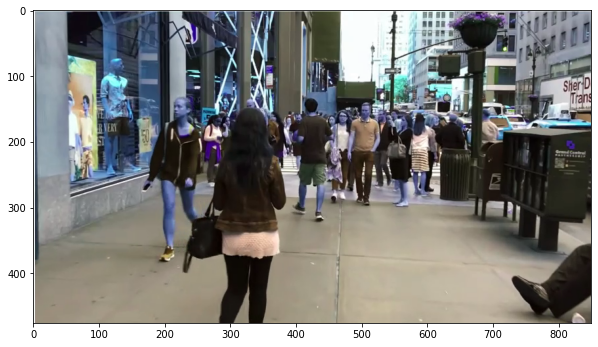

Writing frame 2 / 1567


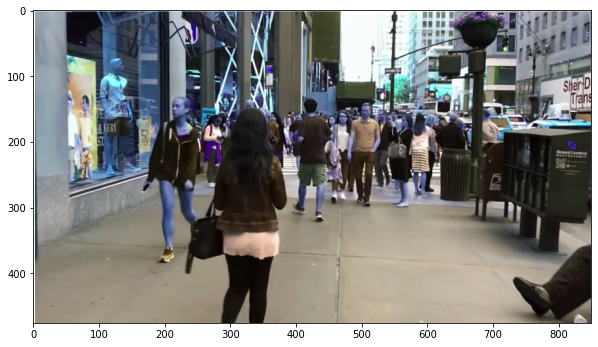

Writing frame 3 / 1567


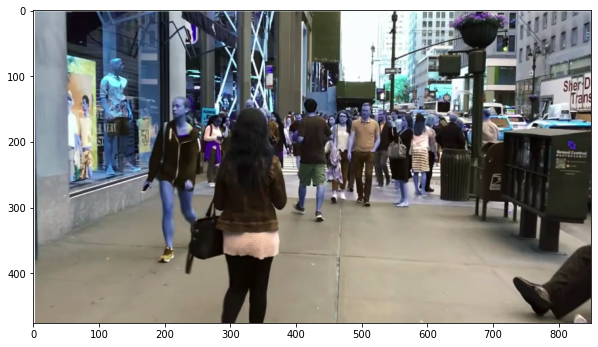

Writing frame 4 / 1567


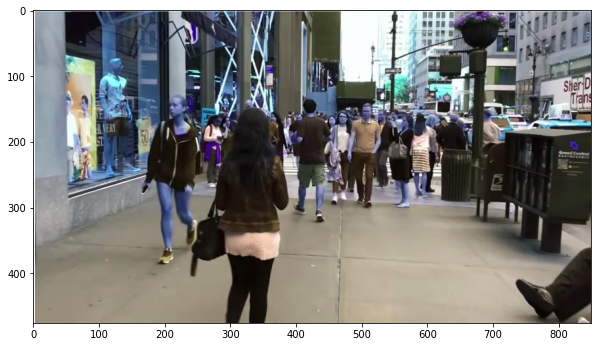

Writing frame 5 / 1567


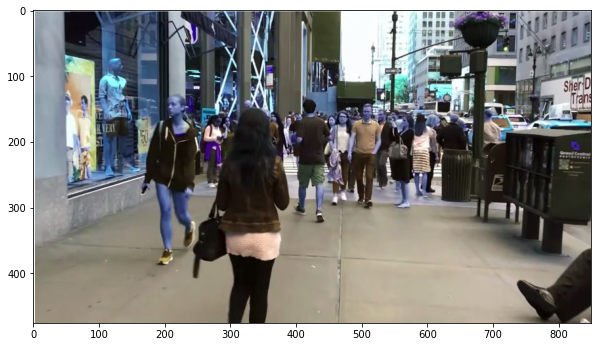

Writing frame 6 / 1567


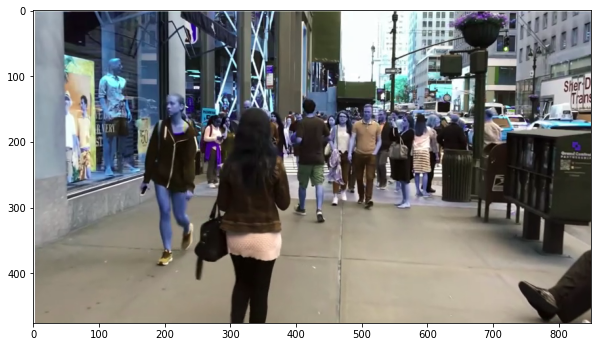

Writing frame 7 / 1567


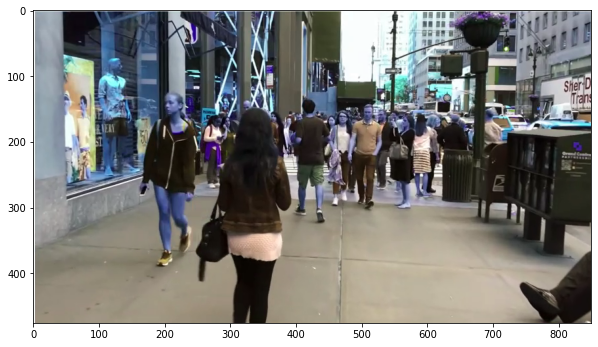

Writing frame 8 / 1567


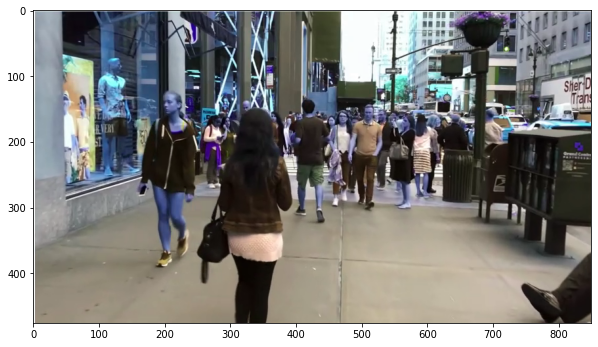

Writing frame 9 / 1567


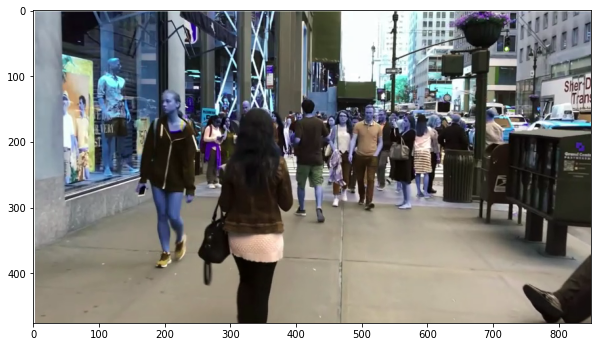

Writing frame 10 / 1567


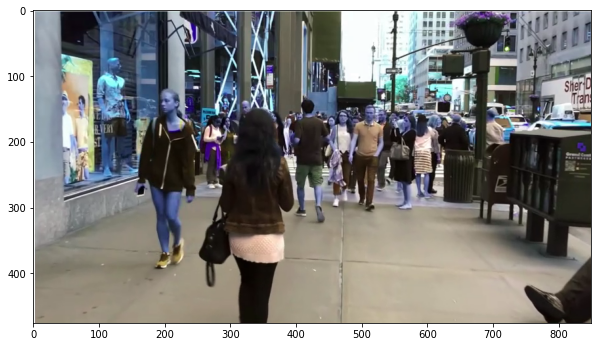

Writing frame 11 / 1567


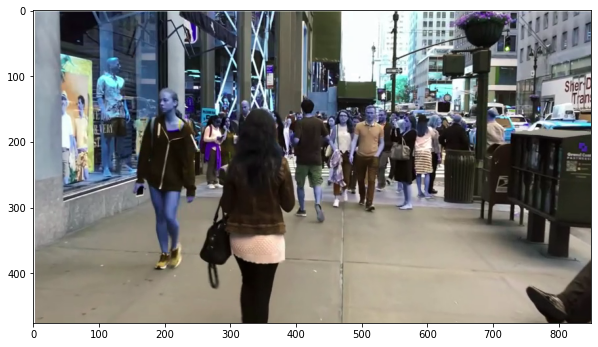

KeyboardInterrupt: 

In [64]:
# Open the input movie file
input_movie = cv2.VideoCapture("facerecognition/nyface_small2.mov")
length = int(input_movie.get(cv2.CAP_PROP_FRAME_COUNT))

# Create an output movie file (make sure resolution/frame rate matches input video!)
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
output_movie = cv2.VideoWriter('output_ny2g.mov', fourcc, 29.97, (640, 360))


Raymond_image = face_recognition.load_image_file("facerecognition/known/Raymond.png")
Raymond_face_encoding = face_recognition.face_encodings(Raymond_image)[0]

Karim_image = face_recognition.load_image_file("facerecognition/known/Karim.png")
Karim_face_encoding = face_recognition.face_encodings(Karim_image)[0]

Rita_image = face_recognition.load_image_file("facerecognition/known/Rita.png")
Rita_face_encoding = face_recognition.face_encodings(Rita_image)[0]

Simon_image = face_recognition.load_image_file("facerecognition/known/Simon.png")
Simon_face_encoding = face_recognition.face_encodings(Simon_image)[0]

Katie_image = face_recognition.load_image_file("facerecognition/known/Katie.png")
Katie_face_encoding = face_recognition.face_encodings(Katie_image)[0]

RJ_image = face_recognition.load_image_file("facerecognition/known/RJ.png")
RJ_face_encoding = face_recognition.face_encodings(RJ_image)[0]

Samantha_image = face_recognition.load_image_file("facerecognition/known/Samantha.png")
Samantha_face_encoding = face_recognition.face_encodings(Samantha_image)[0]

Frank_image = face_recognition.load_image_file("facerecognition/known/Frank.png")
Frank_face_encoding = face_recognition.face_encodings(Frank_image)[0]

known_faces_ny = [
    Raymond_face_encoding,
   Karim_face_encoding,
     Rita_face_encoding,
    Simon_face_encoding,
     Katie_face_encoding,
    RJ_face_encoding,
     Samantha_face_encoding,
    Frank_face_encoding,
]



# Initialize some variables
face_locations = []
face_encodings = []
face_names = []
frame_number = 0


while True:
    # Grab a single frame of video
    ret, frame = input_movie.read()
    frame_number += 1

    # Quit when the input video file ends
    if not ret:
        break

    # Convert the image from BGR color (which OpenCV uses) to RGB color (which face_recognition uses)
    rgb_frame = frame[:, :, ::-1]

    # Find all the faces and face encodings in the current frame of video
    face_locations = face_recognition.face_locations(rgb_frame)
    face_encodings = face_recognition.face_encodings(rgb_frame, face_locations)

    face_names = []
    for face_encoding in face_encodings:
        # See if the face is a match for the known face(s)
        match = face_recognition.compare_faces(known_faces_ny, face_encoding, tolerance=0.50)

        # If you had more than 2 faces, you could make this logic a lot prettier
        # but I kept it simple for the demo
        name = None
        if match[0]:
            name = "Raymond"
        elif match[1]:
            name = "Karim"
        elif match[2]:
            name = "Rita"
        elif match[3]:
            name = "Simon"
        elif match[4]:
            name = "Samantha"
        elif match[5]:
            name = "Katie"
        elif match[6]:
            name = "RJ"
        elif match[7]:
            name = "Frank"

        face_names.append(name)

    # Label the results
    for (top, right, bottom, left), name in zip(face_locations, face_names):
        if not name:
            cv2.rectangle(frame, (left, top), (right, bottom), (0, 255, 0), 2)
            cv2.rectangle(frame, (left, bottom - 25), (right, bottom), (0, 255, 0), cv2.FILLED)
            font = cv2.FONT_HERSHEY_DUPLEX
            cv2.putText(frame, ":)", (left + 6, bottom - 6), font, 0.5, (255, 255, 255), 1)

        if name:
            # Draw a box around the face
            cv2.rectangle(frame, (left, top), (right, bottom), (0, 0,255), 2)

            # Draw a label with a name below the face
            cv2.rectangle(frame, (left, bottom - 25), (right, bottom), (0, 0, 255), cv2.FILLED)
            font = cv2.FONT_HERSHEY_DUPLEX
            cv2.putText(frame, name, (left + 6, bottom - 6), font, 0.5, (255, 255, 255), 1)
    
    cv2.imwrite(str(frame_number) +'.jpg' , frame)
  
    # Write the resulting image to the output video file
    print("Writing frame {} / {}".format(frame_number, length))
    output_movie.write(frame)
    
    plt.figure(figsize=(10,7))
    plt.imshow(frame)
    plt.show()
    

# All done!
input_movie.release()
cv2.destroyAllWindows()

<h2>RESULTS

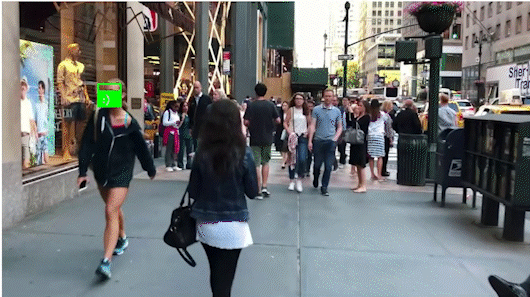

<h1> NY riots face detection

Writing frame 1 / 7846


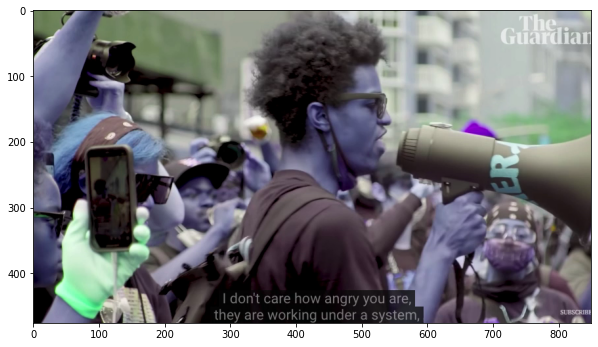

Writing frame 2 / 7846


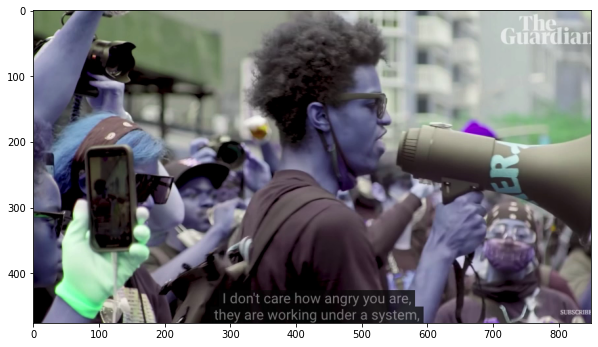

Writing frame 3 / 7846


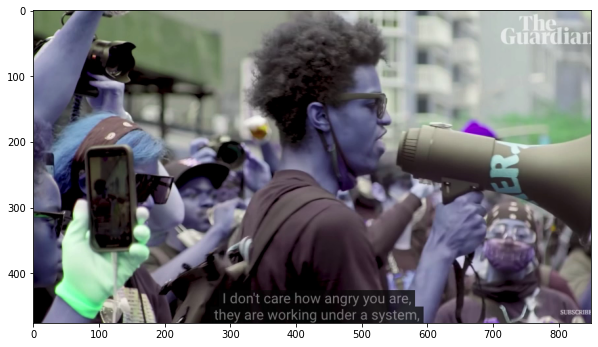

Writing frame 4 / 7846


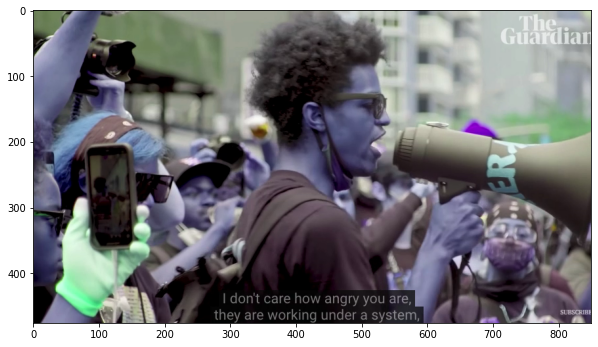

Writing frame 5 / 7846


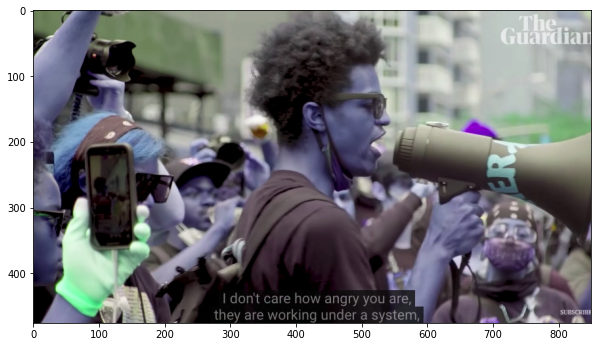

KeyboardInterrupt: 

In [65]:
# Open the input movie file
input_movie = cv2.VideoCapture("facerecognition/BLMriots.mov")
length = int(input_movie.get(cv2.CAP_PROP_FRAME_COUNT))

# Create an output movie file (make sure resolution/frame rate matches input video!)
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
output_movie = cv2.VideoWriter('output_ny2g.mov', fourcc, 29.97, (640, 360))



known3900 = face_recognition.load_image_file\
("/Users/user/Desktop/2023python/facerecognition/Haarcascades/riotfaces/face3900.jpg")
known3900_encoding = face_recognition.face_encodings(known3900)[0]


known4600 = face_recognition.load_image_file\
("/Users/user/Desktop/2023python/facerecognition/Haarcascades/riotfaces/face4600.jpg")
known4600_encoding = face_recognition.face_encodings(known4600)[0]



known_faces_ny = [

    known3900_encoding,
    known4600_encoding,

]


# Initialize some variables
face_locations = []
face_encodings = []
face_names = []
frame_number = 0


while True:
    # Grab a single frame of video
    ret, frame = input_movie.read()
    frame_number += 1

    # Quit when the input video file ends
    if not ret:
        break

    # Convert the image from BGR color (which OpenCV uses) to RGB color (which face_recognition uses)
    rgb_frame = frame[:, :, ::-1]

    # Find all the faces and face encodings in the current frame of video
    face_locations = face_recognition.face_locations(rgb_frame)
    face_encodings = face_recognition.face_encodings(rgb_frame, face_locations)

    face_names = []
    for face_encoding in face_encodings:
        # See if the face is a match for the known face(s)
        match = face_recognition.compare_faces(known_faces_ny, face_encoding, tolerance=0.50)

        # If you had more than 2 faces, you could make this logic a lot prettier
        # but I kept it simple for the demo

        name = None
        if match[0]:
            name = "known3900"
        elif match[1]:
            name = "known4600"

        face_names.append(name)

    # Label the results
    for (top, right, bottom, left), name in zip(face_locations, face_names):
        if not name:
            cv2.rectangle(frame, (left, top), (right, bottom), (0, 255, 0), 2)
            cv2.rectangle(frame, (left, bottom - 25), (right, bottom), (0, 255, 0), cv2.FILLED)
            font = cv2.FONT_HERSHEY_DUPLEX
            cv2.putText(frame, ":)", (left + 6, bottom - 6), font, 0.5, (255, 255, 255), 1)

        if name:
            # Draw a box around the face
            cv2.rectangle(frame, (left, top), (right, bottom), (0, 0,255), 2)

            # Draw a label with a name below the face
            cv2.rectangle(frame, (left, bottom - 25), (right, bottom), (0, 0, 255), cv2.FILLED)
            font = cv2.FONT_HERSHEY_DUPLEX
            cv2.putText(frame, name, (left + 6, bottom - 6), font, 0.5, (255, 255, 255), 1)
    
    cv2.imwrite(str(frame_number) +'.jpg' , frame)
  
    # Write the resulting image to the output video file
    print("Writing frame {} / {}".format(frame_number, length))
    output_movie.write(frame)
    
    plt.figure(figsize=(10,7))
    plt.imshow(frame)
    plt.show()
    

# All done!
input_movie.release()
cv2.destroyAllWindows()